# STL Investigation

The purpose of this notebook is to gain greater understanding of the structure of STL files.  The objective is to see if there is a feasible way to use the geometric information encoded in the STL files along with the tools in the FluidChannel module so that "obstructions" with geometry described in STL files can be used with tLBM. 

In [1]:
import numpy as np
from stl import mesh

We will start with a relatively simple geomety

In [2]:
pyramid_mesh = mesh.Mesh.from_file('Pyramid.stl')

plot the pyramid

In [3]:
%matplotlib notebook
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt 

<IPython.core.display.Javascript object>


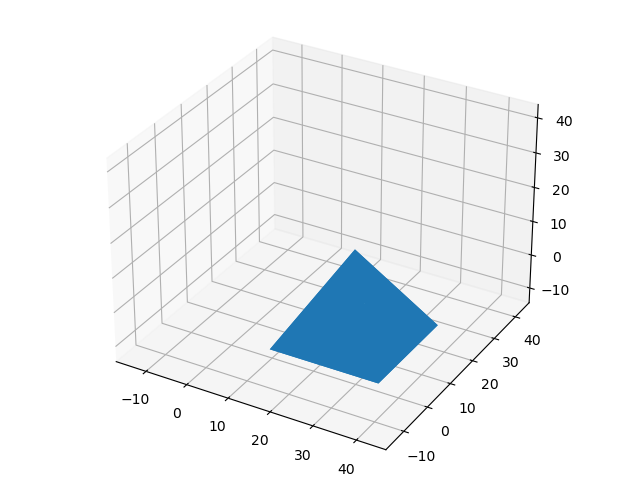

In [4]:
figure = plt.figure()
axes = mplot3d.Axes3D(figure)
axes.add_collection3d(mplot3d.art3d.Poly3DCollection(pyramid_mesh.vectors))
scale = pyramid_mesh.points.flatten()
axes.auto_scale_xyz(scale,scale,scale)
plt.show()


Now I have a Mesh object.  What can I find out about it using the numpy-stl tools?

In [5]:
print(pyramid_mesh.check()); # check to see if it is valid (it had better be...)

True


In [6]:
print(pyramid_mesh.is_closed()); # should be closed

True


In [7]:
print(pyramid_mesh.normals)

[[   0.       625.       312.49896]
 [ 625.         0.       312.5    ]
 [   0.      -625.       312.50104]
 [   0.         0.      -625.     ]
 [   0.         0.      -625.     ]
 [-625.         0.       312.5    ]]


In [8]:
type(pyramid_mesh.normals)

numpy.ndarray

In [9]:
pyramid_mesh.normals.shape

(6, 3)

In [10]:
nfaces = pyramid_mesh.normals.shape[0]
print(f'{"There are %d faces"}' % nfaces)

There are 6 faces


In [11]:
print(pyramid_mesh.v0)

[[ 30.1039    -0.834258  25.      ]
 [ 30.1039    -0.834258  25.      ]
 [ 30.1039    -0.834258  25.      ]
 [ 42.6039   -13.3343     0.      ]
 [ 17.6039   -13.3343     0.      ]
 [ 30.1039    -0.834258  25.      ]]


In [12]:
print(pyramid_mesh.v1)

[[ 42.6039  11.6657   0.    ]
 [ 42.6039 -13.3343   0.    ]
 [ 17.6039 -13.3343   0.    ]
 [ 17.6039 -13.3343   0.    ]
 [ 17.6039  11.6657   0.    ]
 [ 17.6039  11.6657   0.    ]]


In [13]:
print(pyramid_mesh.v2)

[[ 17.6039  11.6657   0.    ]
 [ 42.6039  11.6657   0.    ]
 [ 42.6039 -13.3343   0.    ]
 [ 42.6039  11.6657   0.    ]
 [ 42.6039  11.6657   0.    ]
 [ 17.6039 -13.3343   0.    ]]


I think that I can form equations of a plane for each vertex and the unit normal.  
$$ax + by + cz = d$$
where the normal vector of the triangle $\vec{n}=<a,b,c>$ and $d=ax_0+by_0+cz_0$ with $(x_0,y_0,z_0)$ being a point in the plane (i.e. one of the vertices)

In [14]:
dir(pyramid_mesh)

['_Logged__get_name',
 '__abstractmethods__',
 '__class__',
 '__contains__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__reversed__',
 '__setattr__',
 '__setitem__',
 '__sizeof__',
 '__slots__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_abc_impl',
 '_areas',
 '_ascii_reader',
 '_get_or_update',
 '_load_ascii',
 '_load_binary',
 '_set',
 '_write_ascii',
 '_write_binary',
 'areas',
 'attr',
 'check',
 'data',
 'debug',
 'dtype',
 'error',
 'exception',
 'from_file',
 'from_files',
 'from_multi_file',
 'get',
 'get_header',
 'get_mass_properties',
 'get_mass_properties_with_density',
 'get_unit_normals',
 'info',
 'is_closed',
 'items',
 'keys',
 'load',
 'log',
 'logger',
 'max_',
 'min_',
 'name',
 'norma

I can get a bounding box from the max_ and min_ attributes

In [15]:
pyramid_mesh.max_

array([42.6039, 11.6657, 25.    ], dtype=float32)

In [16]:
pyramid_mesh.min_

array([ 17.6039, -13.3343,   0.    ], dtype=float32)

## Make a Regular Uniform Grid
We will test out these ideas on a regular uniform grid such as is created within FluidChannel

In [32]:
xMin = pyramid_mesh.min_[0];
xMax = pyramid_mesh.max_[0];

yMin = pyramid_mesh.min_[1];
yMax = pyramid_mesh.max_[1];

zMin = pyramid_mesh.min_[2];
zMax = pyramid_mesh.max_[2];

Lx_p = xMax - xMin; Ly_p = yMax - yMin; Lz_p = zMax - zMin;

Lo = zMax - zMin
nDivs = 45; # this will be a coarse grid

Nx = np.ceil((nDivs-1)*(Lx_p/Lo))+1; Nx = int(Nx);
Ny = np.ceil((nDivs-1)*(Ly_p/Lo))+1; Ny = int(Ny);
Nz = np.ceil((nDivs-1)*(Lz_p/Lo))+1; Nz = int(Nz);

x_space = np.linspace(xMin,xMax,Nx).astype(np.float32)
y_space = np.linspace(yMin,yMax,Ny).astype(np.float32)
z_space = np.linspace(zMin,zMax,Nz).astype(np.float32)

Y,Z,X = np.meshgrid(y_space,z_space,x_space); # why is it this way? Oh well...

nnodes = Nx*Ny*Nz

x = np.reshape(X,int(nnodes))
y = np.reshape(Y,int(nnodes))
z = np.reshape(Z,int(nnodes))

vals = np.ones((nnodes,),dtype=np.int32) # 0 is a fluid node, 1 is a solid node
# initialize as a solid node

So now I have a regular uniform grid of points that spans the bounding box for the stl mesh.  For each point in the grid I want to check its surface-sense for planes formed by each of the faces in the mesh (using the normal vector and point in plane approach).  The "solid" nodes will be those that have a **negative** sense to **all** of the surfaces described by the mesh facets (faces). (it occurs to me know that this algorithm will work as stated only for convex hulls -- more thought and effort needed)

## Find Solid Nodes

In [33]:
# let's do this the brute-force way first
for nd in range(nnodes):
    nd_x = x[nd]; nd_y = y[nd]; nd_z = z[nd];
    
    for face in range(nfaces):
        # surface normal components n = <a,b,c>
        a = pyramid_mesh.normals[face,0];
        b = pyramid_mesh.normals[face,1];
        c = pyramid_mesh.normals[face,2];
        # point in plane taken from v0 = x0, y0, z0
        x0 = pyramid_mesh.v0[face,0];
        y0 = pyramid_mesh.v0[face,1];
        z0 = pyramid_mesh.v0[face,2];
        # compute d as shown
        d = a*x0 + b*y0 + c*z0;
        
        surf_sense = a*nd_x + b*nd_y + c*nd_z - d;
        # if surf_sense > 0 then the point is not "under" the surface and thus 
        # not within the volume defined by the mesh. 
        if surf_sense > 0:
            vals[nd] = 0
            break; # no need to continue the "face" for loop
        
            

In [34]:
print(vals)

[1 1 1 ... 0 0 0]


In [35]:
print(Nx)

45


In [36]:
print(Ny)

45


In [37]:
print(Nz)

45


In [38]:
import plotly.graph_objects as go
fig = go.Figure(data=go.Volume(
x=x, y=y,z=z,value=vals,opacity=0.1,surface_count=21))
fig.show()